In [41]:
# Cell 1 — Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import warnings
warnings.filterwarnings('ignore')

from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from torch.optim import AdamW
from transformers import get_linear_schedule_with_warmup

print(f'PyTorch version : {torch.__version__}')
print(f'GPU available   : {torch.cuda.is_available()}')

PyTorch version : 2.10.0+cu128
GPU available   : True


In [42]:
# Cell 2 — Load dataset
df = pd.read_csv('/kaggle/input/datasets/manisha1prakash/marathi-dataset-dm/Marathi_DM_Proj.csv')

df['label'] = df['label'].astype(str).str.strip()
df['label'] = df['label'].map({'1': 'Happy', '0': 'Neutral', '-1': 'Sad'})

print(f'Dataset Shape: {df.shape}')
print(f'\nLabel Distribution:')
print(df['label'].value_counts())
print(f'\nSample rows:')
display(df.head(10))

Dataset Shape: (1500, 2)

Label Distribution:
label
Happy      500
Neutral    500
Sad        500
Name: count, dtype: int64

Sample rows:


,tweet,label
0,कोरोना काळात आपले पंतप्रधान मा. नरेंद्र मोदी...,Happy
1,पुणे येथे राष्ट्रसेवा दल अभ्यासिका विभाग यां...,Happy
2,"पुणे येथील ""क्रांती ज्योती"" या कार्यक्रमात ज...",Neutral
3,आद्यक्रांतिकारक उमाजीराजे नाईक यांना जयंतीनि...,Happy
4,महाराष्ट्राचे मुख्यमंत्री म्हणून शपथ घेतल्या...,Happy
5,अधुनिक भारताचे पहिले समाजक्रांतिकारक महात्मा...,Happy
6,दीपावली लक्ष्मीपूजनानिमित्त आज परळी शहरातील ...,Happy
7,महाराष्ट्र खऱ्या अर्थाने हागणदारीमुक्त व्हाव...,Sad
8,"Wishing everyone a very prosperous, healthy ...",Happy
9,औरंगाबाद मध्य विधानसभा मतदार संघामध्ये अब्दु...,Neutral


In [43]:
# Cell 2b — MuRIL + CNN Hybrid Model Definition
import torch
import torch.nn as nn
from transformers import AutoModel

class MuRILWithCNN(nn.Module):
    """
    MuRIL transformer + CNN head for sequence classification.
    
    Architecture:
      1. MuRIL encoder  →  token embeddings  [B, seq_len, hidden_size]
      2. Three parallel CNN filters (kernel sizes 2,3,4) capture local n-gram patterns
      3. MaxPool over time  →  fixed-length feature vector
      4. Dropout + FC  →  num_labels logits
    """
    def __init__(self, model_name, num_labels,
                 num_filters=128, kernel_sizes=(2, 3, 4), dropout=0.3):
        super().__init__()
        self.encoder = AutoModel.from_pretrained(model_name)
        hidden = self.encoder.config.hidden_size          # 768 for MuRIL-base

        # Parallel Conv1d branches
        self.convs = nn.ModuleList([
            nn.Conv1d(in_channels=hidden,
                      out_channels=num_filters,
                      kernel_size=k)
            for k in kernel_sizes
        ])
        self.relu    = nn.ReLU()
        self.dropout = nn.Dropout(dropout)
        # After MaxPool each branch yields num_filters → concat all branches
        self.fc      = nn.Linear(num_filters * len(kernel_sizes), num_labels)

    def forward(self, input_ids, attention_mask, labels=None):
        # Transformer output: [B, seq_len, hidden]
        out = self.encoder(input_ids=input_ids, attention_mask=attention_mask)
        x   = out.last_hidden_state          # [B, seq_len, H]
        x   = x.permute(0, 2, 1)            # [B, H, seq_len] for Conv1d

        # Apply each conv + relu + global max-pool
        pooled = []
        for conv in self.convs:
            c = self.relu(conv(x))           # [B, num_filters, seq_len-k+1]
            c = c.max(dim=2).values          # [B, num_filters]
            pooled.append(c)

        x = torch.cat(pooled, dim=1)         # [B, num_filters * len(kernels)]
        x = self.dropout(x)
        logits = self.fc(x)                  # [B, num_labels]

        loss = None
        if labels is not None:
            loss = nn.CrossEntropyLoss()(logits, labels)

        # Return a namespace-like object so existing train/eval helpers work
        return type('Output', (), {'loss': loss, 'logits': logits})()

print("MuRILWithCNN model class defined!")


MuRILWithCNN model class defined!


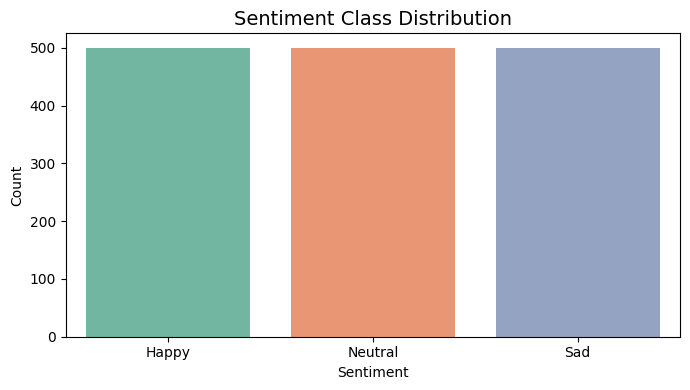

In [44]:
# Cell 3 — Plot class distribution
plt.figure(figsize=(7, 4))
sns.countplot(data=df, x='label', hue='label',
              order=['Happy', 'Neutral', 'Sad'],
              palette='Set2', legend=False)
plt.title('Sentiment Class Distribution', fontsize=14)
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.tight_layout()
plt.savefig('class_distribution.png', dpi=150)
plt.show()

In [45]:
# Cell 4 — Encode labels and split dataset
le = LabelEncoder()
df['encoded_label'] = le.fit_transform(df['label'])
label_names = le.classes_.tolist()   # ['Happy', 'Neutral', 'Sad']
num_labels  = len(label_names)

print(f'Label mapping : {dict(zip(le.classes_, le.transform(le.classes_)))}')
print(f'Number of classes: {num_labels}')

X = df['tweet'].tolist()
y = df['encoded_label'].tolist()

# ✅ Same split as bert-models: 70/15/15
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, random_state=42, stratify=y)
X_val,   X_test, y_val,   y_test = train_test_split(X_temp, y_temp, test_size=0.50, random_state=42, stratify=y_temp)

print(f'\nSplit → Train: {len(X_train)}, Val: {len(X_val)}, Test: {len(X_test)}')

Label mapping : {'Happy': np.int64(0), 'Neutral': np.int64(1), 'Sad': np.int64(2)}
Number of classes: 3

Split → Train: 1050, Val: 225, Test: 225


In [46]:
# Cell 5 — Dataset class
class EmotionDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts     = texts
        self.labels    = labels
        self.tokenizer = tokenizer
        self.max_len   = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        enc = self.tokenizer(
            self.texts[idx],
            max_length=self.max_len,
            padding='max_length',
            truncation=True,
            return_tensors='pt'
        )
        return {
            'input_ids':      enc['input_ids'].squeeze(),
            'attention_mask': enc['attention_mask'].squeeze(),
            'labels':         torch.tensor(self.labels[idx], dtype=torch.long)  # ✅ key is 'labels'
        }

print('Dataset class ready!')

Dataset class ready!


In [47]:
# Cell 6 — Train and Evaluate helper functions
def train_epoch(model, dataloader, optimizer, scheduler, device):
    model.train()
    total_loss, correct, total = 0, 0, 0
    for batch in dataloader:
        ids  = batch['input_ids'].to(device)
        mask = batch['attention_mask'].to(device)
        lbls = batch['labels'].to(device)

        optimizer.zero_grad()
        out = model(input_ids=ids, attention_mask=mask, labels=lbls)
        out.loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        scheduler.step()

        total_loss += out.loss.item()
        preds = torch.argmax(out.logits, dim=1)
        correct += (preds == lbls).sum().item()
        total   += lbls.size(0)
    return total_loss / len(dataloader), correct / total


def evaluate(model, dataloader, device):
    model.eval()
    total_loss, all_preds, all_labels = 0, [], []
    with torch.no_grad():
        for batch in dataloader:
            ids  = batch['input_ids'].to(device)
            mask = batch['attention_mask'].to(device)
            lbls = batch['labels'].to(device)

            out = model(input_ids=ids, attention_mask=mask, labels=lbls)
            total_loss += out.loss.item()
            preds = torch.argmax(out.logits, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(lbls.cpu().numpy())

    acc = accuracy_score(all_labels, all_preds)
    f1  = f1_score(all_labels, all_preds, average='weighted')
    return total_loss / len(dataloader), acc, f1, all_preds, all_labels

print('Helper functions ready!')

Helper functions ready!


In [48]:
# Cell 6b — Reproducibility seed (add before training)
import random
import os
os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'  # required for deterministic CUDA

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# Force deterministic CUDA ops (small speed cost)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark     = False

print(f"All seeds set to {SEED} — results will now be reproducible.")

All seeds set to 42 — results will now be reproducible.


In [49]:
# Cell 7 — Run MuRIL + CNN (30 epochs)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

MODEL_NAME   = 'google/muril-base-cased'
DISPLAY_NAME = 'MuRIL_CNN'
EPOCHS       = 30
BATCH_SIZE   = 8
LR           = 2e-5
MAX_LEN      = 128

print(f"\n{'='*60}")
print(f'  Running : {DISPLAY_NAME}')
print(f'  Model ID: {MODEL_NAME}')
print(f"{'='*60}")
print(f'  Device  : {device}')

tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

# Build MuRIL + CNN hybrid
model = MuRILWithCNN(
    model_name   = MODEL_NAME,
    num_labels   = num_labels,
    num_filters  = 128,
    kernel_sizes = (2, 3, 4),
    dropout      = 0.3
)
model.to(device)
# Add this right after model.to(device) in Cell 7
torch.use_deterministic_algorithms(True)

use_gpu = device.type == 'cuda'
train_dl = DataLoader(EmotionDataset(X_train, y_train, tokenizer, MAX_LEN),
                      batch_size=BATCH_SIZE, shuffle=True,
                      num_workers=0, pin_memory=use_gpu)
val_dl   = DataLoader(EmotionDataset(X_val,   y_val,   tokenizer, MAX_LEN),
                      batch_size=BATCH_SIZE,
                      num_workers=0, pin_memory=use_gpu)
test_dl  = DataLoader(EmotionDataset(X_test,  y_test,  tokenizer, MAX_LEN),
                      batch_size=BATCH_SIZE,
                      num_workers=0, pin_memory=use_gpu)

optimizer   = AdamW(model.parameters(), lr=LR, weight_decay=0.01)
total_steps = len(train_dl) * EPOCHS
scheduler   = get_linear_schedule_with_warmup(
                  optimizer,
                  num_warmup_steps=total_steps // 10,
                  num_training_steps=total_steps)

best_val_acc, best_state = 0, None
history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

for epoch in range(1, EPOCHS + 1):
    tr_loss, tr_acc               = train_epoch(model, train_dl, optimizer, scheduler, device)
    vl_loss, vl_acc, vl_f1, _, _ = evaluate(model, val_dl, device)

    history['train_loss'].append(tr_loss)
    history['val_loss'].append(vl_loss)
    history['train_acc'].append(tr_acc)
    history['val_acc'].append(vl_acc)

    print(f'  Epoch {epoch}/{EPOCHS} | '
          f'Train Loss: {tr_loss:.4f}  Acc: {tr_acc:.4f} | '
          f'Val Loss: {vl_loss:.4f}  Acc: {vl_acc:.4f}  F1: {vl_f1:.4f}')

    if vl_acc > best_val_acc:
        best_val_acc = vl_acc
        best_state   = {k: v.clone() for k, v in model.state_dict().items()}

print('\n✅ Training complete.')



  Running : MuRIL_CNN
  Model ID: google/muril-base-cased
  Device  : cuda


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: google/muril-base-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.decoder.weight             | UNEXPECTED |  | 
bert.embeddings.position_ids               | UNEXPECTED |  | 
cls.predictions.decoder.bias               | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  Epoch 1/30 | Train Loss: 1.0981  Acc: 0.3514 | Val Loss: 1.0981  Acc: 0.3333  F1: 0.1667
  Epoch 2/30 | Train Loss: 1.0841  Acc: 0.4790 | Val Loss: 1.0300  Acc: 0.7822  F1: 0.7825
  Epoch 3/30 | Train Loss: 0.9407  Acc: 0.8019 | Val Loss: 0.8787  Acc: 0.7378  F1: 0.7198
  Epoch 4/30 | Train Loss: 0.7240  Acc: 0.8638 | Val Loss: 0.7220  Acc: 0.7778  F1: 0.7791
  Epoch 5/30 | Train Loss: 0.4705  Acc: 0.9229 | Val Loss: 0.7206  Acc: 0.7733  F1: 0.7721
  Epoch 6/30 | Train Loss: 0.3163  Acc: 0.9314 | Val Loss: 0.6251  Acc: 0.7822  F1: 0.7812
  Epoch 7/30 | Train Loss: 0.1781  Acc: 0.9714 | Val Loss: 0.7651  Acc: 0.7733  F1: 0.7718
  Epoch 8/30 | Train Loss: 0.1401  Acc: 0.9733 | Val Loss: 1.0368  Acc: 0.7600  F1: 0.7605
  Epoch 9/30 | Train Loss: 0.1028  Acc: 0.9810 | Val Loss: 0.7964  Acc: 0.7867  F1: 0.7862
  Epoch 10/30 | Train Loss: 0.0648  Acc: 0.9895 | Val Loss: 0.8590  Acc: 0.7956  F1: 0.7967
  Epoch 11/30 | Train Loss: 0.0523  Acc: 0.9914 | Val Loss: 0.9388  Acc: 0.7867  F1: 0.78

In [50]:
# Cell 8 — Evaluate on Test Set
model.load_state_dict(best_state)
_, ts_acc, ts_f1, ts_preds, ts_labels = evaluate(model, test_dl, device)

print(f'\n  Test Accuracy      : {ts_acc:.4f}')
print(f'  Test F1 (weighted) : {ts_f1:.4f}')
print(f'\n  Classification Report:')
print(classification_report(ts_labels, ts_preds, target_names=label_names))


  Test Accuracy      : 0.8533
  Test F1 (weighted) : 0.8541

  Classification Report:
              precision    recall  f1-score   support

       Happy       0.90      0.81      0.85        75
     Neutral       0.77      0.84      0.80        75
         Sad       0.91      0.91      0.91        75

    accuracy                           0.85       225
   macro avg       0.86      0.85      0.85       225
weighted avg       0.86      0.85      0.85       225



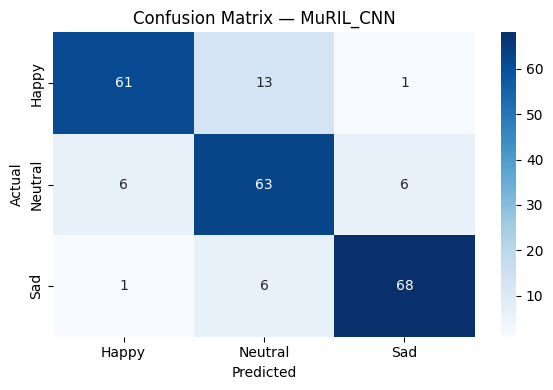

In [51]:
# Cell 9 — Confusion Matrix
cm = confusion_matrix(ts_labels, ts_preds)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=label_names, yticklabels=label_names)
plt.title(f'Confusion Matrix — {DISPLAY_NAME}')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.tight_layout()
plt.savefig(f'/kaggle/working/cm_{DISPLAY_NAME}.png', dpi=150)
plt.show()

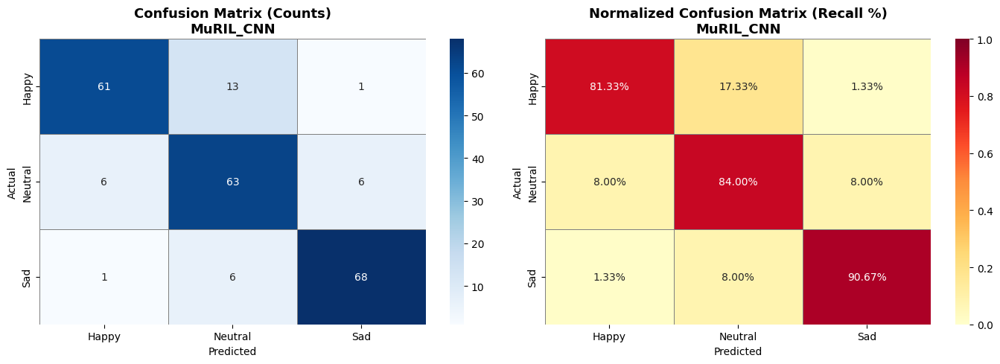

Heatmap saved.


In [52]:
# Cell 9b — Normalized Confusion Matrix Heatmap
import numpy as np

cm_norm = confusion_matrix(ts_labels, ts_preds).astype(float)
cm_norm = cm_norm / cm_norm.sum(axis=1, keepdims=True)  # Normalize row-wise

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# --- Left: Raw counts (your existing Cell 9, now side-by-side) ---
cm_raw = confusion_matrix(ts_labels, ts_preds)
sns.heatmap(cm_raw, annot=True, fmt='d', cmap='Blues',
            xticklabels=label_names, yticklabels=label_names,
            ax=axes[0], linewidths=0.5, linecolor='gray')
axes[0].set_title(f'Confusion Matrix (Counts)\n{DISPLAY_NAME}', fontsize=13, fontweight='bold')
axes[0].set_ylabel('Actual')
axes[0].set_xlabel('Predicted')

# --- Right: Normalized heatmap ---
sns.heatmap(cm_norm, annot=True, fmt='.2%', cmap='YlOrRd',
            xticklabels=label_names, yticklabels=label_names,
            ax=axes[1], vmin=0, vmax=1,
            linewidths=0.5, linecolor='gray')
axes[1].set_title(f'Normalized Confusion Matrix (Recall %)\n{DISPLAY_NAME}', fontsize=13, fontweight='bold')
axes[1].set_ylabel('Actual')
axes[1].set_xlabel('Predicted')

plt.tight_layout()
plt.savefig(f'/kaggle/working/heatmap_{DISPLAY_NAME}.png', dpi=150)
plt.show()
print("Heatmap saved.")

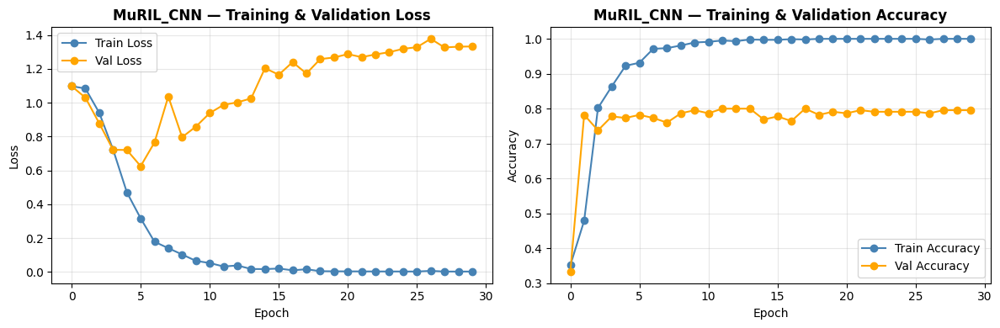

In [53]:
# Cell 10 — Training & Validation Loss and Accuracy graphs
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.plot(history['train_loss'], marker='o', color='steelblue', label='Train Loss')
ax1.plot(history['val_loss'],   marker='o', color='orange',    label='Val Loss')
ax1.set_title(f'{DISPLAY_NAME} — Training & Validation Loss', fontsize=12, fontweight='bold')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(history['train_acc'], marker='o', color='steelblue', label='Train Accuracy')
ax2.plot(history['val_acc'],   marker='o', color='orange',    label='Val Accuracy')
ax2.set_title(f'{DISPLAY_NAME} — Training & Validation Accuracy', fontsize=12, fontweight='bold')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'/kaggle/working/curve_{DISPLAY_NAME}.png', dpi=150)
plt.show()

In [54]:
# Cell 12 — Sample Predictions
def predict_sentiment(texts, model, tokenizer, device, label_names):
    model.eval()
    results = []
    for text in texts:
        enc = tokenizer(text, max_length=128, padding='max_length',
                        truncation=True, return_tensors='pt')
        ids  = enc['input_ids'].to(device)
        mask = enc['attention_mask'].to(device)
        with torch.no_grad():
            out = model(input_ids=ids, attention_mask=mask)
        probs = torch.softmax(out.logits, dim=1).cpu().numpy()[0]
        results.append({
            'text':       text[:80] + ('...' if len(text) > 80 else ''),
            'sentiment':  label_names[probs.argmax()],
            'confidence': f'{probs.max()*100:.1f}%'
        })
    return pd.DataFrame(results)


test_sentences = [
    'आज खूप आनंद झाला! हे खूप छान आहे!',
    'आज काहीच विशेष नाही, सगळं नेहमीसारखं आहे.',
    'मला खूप दुःख होत आहे, कोणी नाही माझ्यासाठी.',
    'हे खरोखरच अविश्वसनीय आहे!',
    'आज हवामान ठीक आहे.',
]

preds = predict_sentiment(test_sentences, model, tokenizer, device, label_names)
print(preds.to_string(index=False))


                                       text sentiment confidence
          आज खूप आनंद झाला! हे खूप छान आहे!     Happy      99.0%
  आज काहीच विशेष नाही, सगळं नेहमीसारखं आहे.     Happy      81.6%
मला खूप दुःख होत आहे, कोणी नाही माझ्यासाठी.       Sad      99.1%
                  हे खरोखरच अविश्वसनीय आहे!       Sad      99.1%
                         आज हवामान ठीक आहे.     Happy      98.9%


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  20%|██        | 1/5 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  60%|██████    | 3/5 [00:22<00:11,  5.60s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  80%|████████  | 4/5 [00:34<00:08,  8.07s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|██████████| 5/5 [00:45<00:00,  9.36s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 6it [00:57, 11.57s/it]                       

SHAP values computed!
Shape: (5, None, 3)


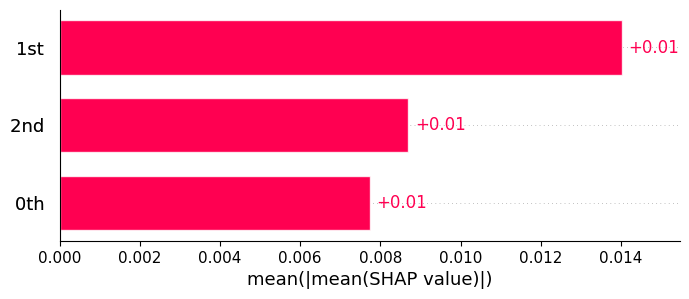

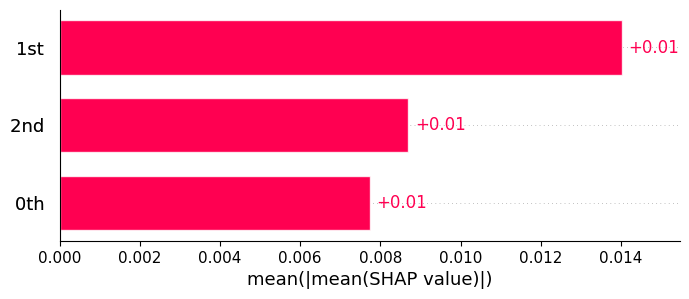

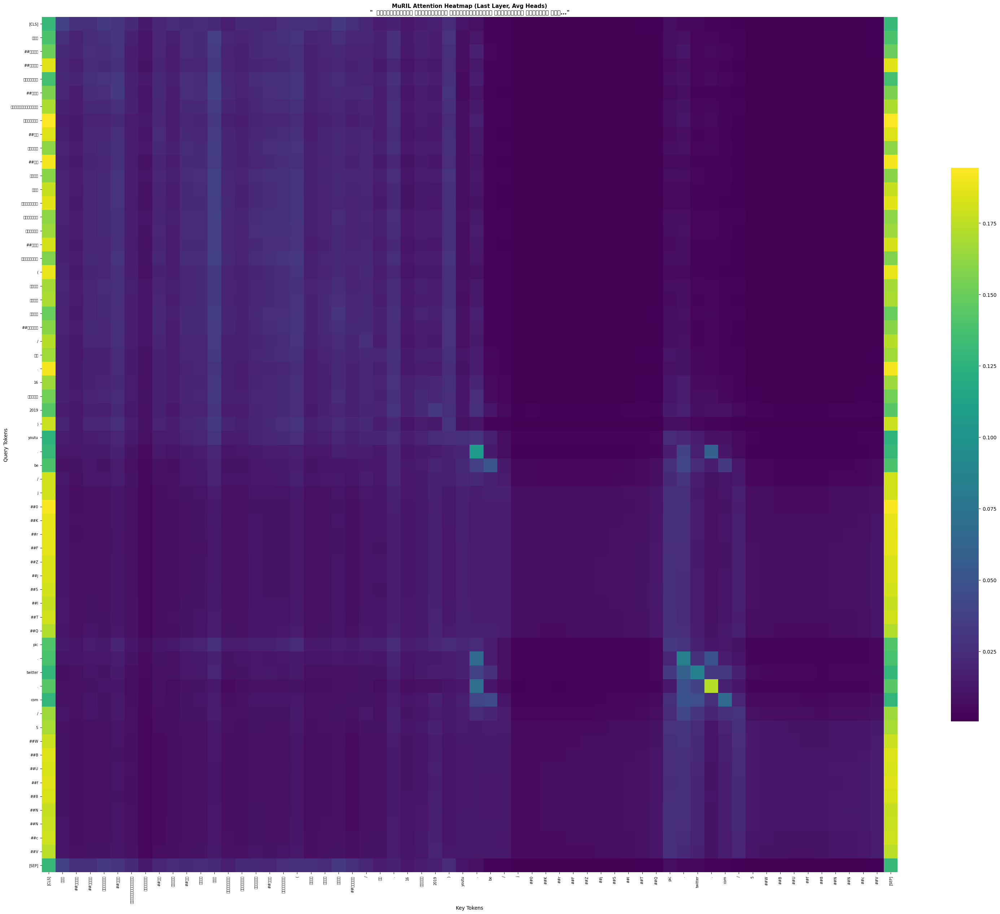


=== Per-sample Explanations (Test Set, first 5) ===

[1] Text     :   शेतमालाच्या निर्यातीला आंतरराष्ट्रीय बाजारातील मागणीचा आधार आणि त्या...
     True     : Neutral
     Predicted: Neutral  (98.7% confidence)
     Happy   :  1.0%
     Neutral : █████████████████████████████ 98.7%
     Sad     :  0.4%

[2] Text     :   पुण्यात मुसळधार पावसामुळे मोठे संकट ओढावले आहे. ७ जणांचा दुर्दैवी मृ...
     True     : Sad
     Predicted: Sad  (99.1% confidence)
     Happy   :  0.4%
     Neutral :  0.5%
     Sad     : █████████████████████████████ 99.1%

[3] Text     :   त्यातच केंद्र सरकारकडून केंद्रीय करातील हिश्यापोटी राज्याला मिळणारे ...
     True     : Sad
     Predicted: Sad  (99.1% confidence)
     Happy   :  0.4%
     Neutral :  0.5%
     Sad     : █████████████████████████████ 99.1%

[4] Text     :   आज अनंत चतुर्दशी निमित्त संगमनेरच्या श्री सोमेश्वर रंगार गल्ली येथील...
     True     : Happy
     Predicted: Happy  (99.2% confidence)
     Happy   : █████████████████████████████ 99.2%
     

In [58]:
# ================================
# XAI Cell — Explainable AI for MuRIL + CNN
# Using SHAP (KernelExplainer) + Attention Visualization
# ================================

# pip install shap  (run in a separate cell if needed)
# !pip install shap

import shap
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from transformers import AutoTokenizer

# ── 0. Reload best model (if GPU was cleared in Cell 12) ──────────────────────
# If you deleted the model, reload it:
# model = MuRILWithCNN(MODEL_NAME, num_labels, num_filters=128,
#                      kernel_sizes=(2,3,4), dropout=0.3)
# model.load_state_dict(best_state)
# model.to(device)
# model.eval()

# ── 1. Prediction wrapper for SHAP ────────────────────────────────────────────
def predict_proba(texts):
    """Takes a list of strings, returns numpy array of shape [N, num_labels]."""
    model.eval()
    all_probs = []
    for text in texts:
        enc = tokenizer(
            str(text),
            max_length=MAX_LEN,
            padding='max_length',
            truncation=True,
            return_tensors='pt'
        )
        ids  = enc['input_ids'].to(device)
        mask = enc['attention_mask'].to(device)
        with torch.no_grad():
            out = model(input_ids=ids, attention_mask=mask)
        probs = torch.softmax(out.logits, dim=1).cpu().numpy()[0]
        all_probs.append(probs)
    return np.array(all_probs)

# ── 2. SHAP with text-compatible explainer ───────────────────────────────────
masker    = shap.maskers.Text(tokenizer)
explainer = shap.Explainer(predict_proba, masker, output_names=label_names)

explain_texts = X_test[:5]   # keep small — this is slow
shap_values   = explainer(explain_texts)

print("SHAP values computed!")
print(f"Shape: {shap_values.shape}")

# ── 3. SHAP text plots ────────────────────────────────────────────────────────
# Plot token-level SHAP for each sample
for i in range(len(explain_texts)):
    shap.plots.text(shap_values[i], display=True)

# Bar summary across all samples
shap.plots.bar(shap_values.mean(0), show=True)


# ── 3. SHAP Summary Plot (all classes) ────────────────────────────────────────
# ── 3. SHAP text plots ────────────────────────────────────────────────────────
for i in range(len(explain_texts)):
    shap.plots.text(shap_values[i], display=True)

shap.plots.bar(shap_values.mean(0), show=True)


# ── 4. Token-level Attention Heatmap ─────────────────────────────────────────
# Extract attention weights from MuRIL for a single sample
def get_attention_heatmap(text, model, tokenizer, device, layer=-1):
    """Returns (tokens, attention_matrix) for the last attention layer."""
    model.eval()
    enc = tokenizer(
        text,
        max_length=MAX_LEN,
        padding='max_length',
        truncation=True,
        return_tensors='pt'
    )
    ids  = enc['input_ids'].to(device)
    mask = enc['attention_mask'].to(device)

    # Temporarily switch encoder to eager attention to get attention weights
    original_attn = model.encoder.config._attn_implementation
    model.encoder.config._attn_implementation = 'eager'

    with torch.no_grad():
        out = model.encoder(
            input_ids=ids,
            attention_mask=mask,
            output_attentions=True
        )

    # Restore original attention implementation
    model.encoder.config._attn_implementation = original_attn

    attn    = out.attentions[layer][0]       # [heads, seq, seq]
    attn    = attn.mean(dim=0).cpu().numpy() # [seq, seq]

    seq_len = mask.sum().item()
    attn    = attn[:seq_len, :seq_len]
    tokens  = tokenizer.convert_ids_to_tokens(ids[0][:seq_len].cpu().tolist())
    return tokens, attn


# Pick a sample from the test set
sample_text = X_test[0]
tokens, attn_matrix = get_attention_heatmap(sample_text, model, tokenizer, device)

fig, ax = plt.subplots(figsize=(max(8, len(tokens)//2), max(6, len(tokens)//2)))
sns.heatmap(
    attn_matrix,
    xticklabels=tokens,
    yticklabels=tokens,
    cmap='viridis',
    ax=ax,
    square=True,
    cbar_kws={'shrink': 0.5}
)
ax.set_title(f'MuRIL Attention Heatmap (Last Layer, Avg Heads)\n"{sample_text[:60]}..."',
             fontsize=11, fontweight='bold')
ax.set_xlabel('Key Tokens')
ax.set_ylabel('Query Tokens')
plt.xticks(rotation=90, fontsize=7)
plt.yticks(rotation=0, fontsize=7)
plt.tight_layout()
plt.savefig(f'/kaggle/working/attention_heatmap_{DISPLAY_NAME}.png', dpi=150, bbox_inches='tight')
plt.show()


# ── 5. Per-sample Prediction Explanation ──────────────────────────────────────
print("\n=== Per-sample Explanations (Test Set, first 5) ===\n")
for i in range(min(5, len(X_test))):
    text      = X_test[i]
    true_lbl  = label_names[y_test[i]]
    probs     = predict_proba([text])[0]
    pred_lbl  = label_names[probs.argmax()]
    conf      = probs.max() * 100

    print(f"[{i+1}] Text     : {text[:70]}{'...' if len(text)>70 else ''}")
    print(f"     True     : {true_lbl}")
    print(f"     Predicted: {pred_lbl}  ({conf:.1f}% confidence)")
    for j, lbl in enumerate(label_names):
        bar = '█' * int(probs[j] * 30)
        print(f"     {lbl:<8}: {bar} {probs[j]*100:.1f}%")
    print()